In [1]:
!gdown -O facenet-data.zip https://drive.google.com/uc?id=1kCQxmbJzZPyoyt10H4QAqAUZFhqNZuZG
!unzip -d facenet-data facenet-data.zip

Downloading...
From: https://drive.google.com/uc?id=1kCQxmbJzZPyoyt10H4QAqAUZFhqNZuZG
To: /home/jovyan/work/facenet-data.zip
100%|████████████████████████████████████████| 496M/496M [00:43<00:00, 11.4MB/s]
Archive:  facenet-data.zip
   creating: facenet-data/subset/
 extracting: facenet-data/subset/Fred_Eckhard_1.npz  
 extracting: facenet-data/subset/Kevin_Spacey_3.npz  
 extracting: facenet-data/subset/Amanda_Beard_2.npz  
 extracting: facenet-data/subset/Barbara_Brezigar_2.npz  
 extracting: facenet-data/subset/Daniel_Kurtzer_2.npz  
 extracting: facenet-data/subset/Kevin_Spacey_2.npz  
 extracting: facenet-data/subset/Fred_Eckhard_2.npz  
 extracting: facenet-data/subset/Lauren_Hutton_3.npz  
 extracting: facenet-data/subset/Amanda_Beard_0.npz  
 extracting: facenet-data/subset/Daniel_Kurtzer_1.npz  
 extracting: facenet-data/subset/Alison_Lohman_5.npz  
 extracting: facenet-data/subset/Andrew_Bernard_2.npz  
 extracting: facenet-data/subset/Robert_F_Kennedy_Jr_0.npz  
 extracting:

In [2]:
#data_dir = '/kaggle/temp/youtube-faces-with-facial-keypoints'
#data_dir = '/kaggle/input/faceid-preprocessed'
data_dir = 'facenet-data/subset'

In [3]:
import pandas as pd
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import os

In [4]:
import torch
import torchvision

In [5]:
df = pd.read_csv(f'{data_dir}/youtube_faces_with_keypoints_full.csv')
df

,videoID,personName,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson
0,Alison_Lohman_0,Alison_Lohman,228.0,213.0,240.0,90.150000,6.0
1,Alison_Lohman_1,Alison_Lohman,248.0,201.0,79.0,108.417722,6.0
2,Alison_Lohman_2,Alison_Lohman,335.0,308.0,136.0,122.161765,6.0
3,Alison_Lohman_3,Alison_Lohman,151.0,110.0,53.0,58.000000,6.0
4,Alison_Lohman_4,Alison_Lohman,236.0,228.0,147.0,91.680272,6.0
5,Alison_Lohman_5,Alison_Lohman,227.0,179.0,68.0,105.647059,6.0
6,Kevin_Spacey_0,Kevin_Spacey,196.0,264.0,91.0,99.912088,6.0
7,Kevin_Spacey_1,Kevin_Spacey,260.0,217.0,59.0,120.186441,6.0
8,Kevin_Spacey_2,Kevin_Spacey,186.0,175.0,71.0,86.746479,6.0
9,Kevin_Spacey_3,Kevin_Spacey,100.0,89.0,99.0,44.636364,6.0


In [6]:
import facenet_pytorch

class MtcnnTransform:
    def __init__(self):
        self.mtcnn = facenet_pytorch.MTCNN(image_size=224, margin=0)
        self.to_pil = torchvision.transforms.ToPILImage()
        
    def __call__(self, img, lms):
        return self.mtcnn(self.to_pil(img))

In [7]:
import PIL

class ResizeTransform:
    def __init__(self):
        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

In [30]:
import PIL
import cv2

class NormalizeTransform:
    def __init__(self, ratio=0.333, color_jitter=0):
        self.ratio = ratio

        self.jawPoints          = [ 0,17]
        self.rigthEyebrowPoints = [17,22]
        self.leftEyebrowPoints  = [22,27]
        self.noseRidgePoints    = [27,31]
        self.noseBasePoints     = [31,36]
        self.rightEyePoints     = [36,42]
        self.leftEyePoints      = [42,48]
        self.outerMouthPoints   = [48,60]
        self.innerMouthPoints   = [60,68]

        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.ColorJitter(saturation=color_jitter),
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        data = self.face_transform(data, landmarks)
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

    def face_transform(self, data, landmarks):
        # see FaceId-Normalization.ipynb
        pt1 = self.avg(landmarks[self.leftEyePoints[0]:self.leftEyePoints[1]])
        pt2 = self.avg(landmarks[self.outerMouthPoints[0]:self.outerMouthPoints[1]])
        pt3 = self.avg(landmarks[self.rightEyePoints[0]:self.rightEyePoints[1]])
        src_pts = np.float32([pt1, pt2, pt3])
        dst_pts = np.float32([
            [data.shape[0]*self.ratio, data.shape[1]*self.ratio],
            [data.shape[0]/2, data.shape[1]*(1-self.ratio)],
            [data.shape[0]*(1-self.ratio), data.shape[1]*self.ratio]
        ])
        M = cv2.getAffineTransform(src_pts, dst_pts)
        data = cv2.warpAffine(data, M, data.shape[:2])
        return data
    
    def avg(self, pts):
        x = sum(x for x,y in pts) / len(pts)
        y = sum(y for x,y in pts) / len(pts)
        return x, y

In [9]:
import random
import pickle

random.seed()

class YouTubeFacesDataset(torch.utils.data.Dataset):
    def __init__(self, df, folder = '.', transform = MtcnnTransform(),
                 cache_lim = 200,
                 preload = False, preprocess = False,
                 anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1,
                 stochastic_set_fraction = 0.8):
        self.transform = transform
        self.cache = {}
        self.cache_lim = 0 if preload else cache_lim
        self.preprocessed_cache = {}
        self.data = {}
        for p in tqdm(df['personName'].unique(), desc='Loading data'):
            self.data[p] = []
            for fn, cnt in df[df['personName'] == p][['videoID', 'videoDuration']].values:
                fp = f'{folder}/{fn}.npz'
                cnt = int(cnt)
                self.data[p] += [(fp, i) for i in range(cnt)]
                if preload:
                    self.cache_lim += 1
                    imgs, lms = self._cache_get(fp)
                    assert imgs.shape[-1] == cnt
                    assert lms.shape[-1] == cnt
                if preprocess:
                    pfp = self._preprocess(fp)
                    imgs = self._load_preprocessed(pfp)
                    assert len(imgs) == cnt
                    self.preprocessed_cache[fp] = imgs
        self.persons = list(self.data.keys())
        self.neg_data = {}
        for p in self.persons:
            self.neg_data[p] = []
            for p_neg in self.persons:
                if p_neg == p:
                    continue
                self.neg_data[p] += self.data[p_neg]
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def resize(self, anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1, stochastic_set_fraction = 0.8):
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def __len__(self):
        return len(self.persons) * self.anchor_set_len * self.positive_set_len * self.negative_set_len
    
    def __getitem__(self, index):
        p_i = index // self.negative_set_len // self.positive_set_len // self.anchor_set_len
        assert p_i >= 0
        assert p_i < len(self.persons)
        p = self.persons[p_i]
        if self.negative_set_len > len(self.neg_data[p]) * self.stochastic_set_fraction:
            negative_i = index % self.negative_set_len
            negative_i = negative_i % len(self.neg_data[p])
        else:
            negative_i = random.randint(0, len(self.neg_data[p]) - 1)
        assert negative_i >= 0
        assert negative_i < len(self.neg_data[p])
        if self.positive_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            positive_i = (index // self.negative_set_len) % self.positive_set_len
            positive_i = positive_i % len(self.data[p])
        else:
            positive_i = random.randint(0, len(self.data[p]) - 1)
        assert positive_i >= 0
        assert positive_i < len(self.data[p])
        if self.anchor_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            anchor_i = (index // self.negative_set_len // self.positive_set_len) % self.anchor_set_len
            anchor_i = anchor_i % len(self.data[p])
        else:
            anchor_i = random.randint(0, len(self.data[p]) - 1)
        assert anchor_i >= 0
        assert anchor_i < len(self.data[p])
        return self._load(*self.data[p][anchor_i]), self._load(*self.data[p][positive_i]), self._load(*self.neg_data[p][negative_i])
    
    def _load(self, fp, i):
        if fp in self.preprocessed_cache:
            assert i < len(self.preprocessed_cache[fp]), (fp, i, len(self.preprocessed_cache[fp]))
            if self.preprocessed_cache[fp][i] is not None:
                return self.preprocessed_cache[fp][i]
        imgs, lms = self._cache_get(fp)
        assert i < imgs.shape[-1], (fp, i, imgs.shape[-1])
        data = imgs[:,:,:,i]
        assert i < lms.shape[-1], (fp, i, lms.shape[-1])
        lms = lms[:,:,i]
        if self.transform:
            data = self.transform(data, lms)
        return data
    
    def _cache_get(self, fp):
        if fp in self.cache:
            return self.cache[fp]
        if len(self.cache) > self.cache_lim:
            idx = random.randint(0, len(self.cache) - 1)
            key = list(self.cache.keys())[idx]
            del self.cache[key]
        d = np.load(fp)
        # trigger lazy loading
        self.cache[fp] = (d['colorImages'], d['landmarks2D'])
        return self.cache[fp]
    
    def _preprocess(self, fp):
        pfp = f'{fp}.pkl'
        if not os.path.exists(pfp):
            imgs, lms = self._cache_get(fp)
            d = [self._load(fp, i) for i in range(imgs.shape[-1])]
            with open(pfp, 'wb') as f:
                pickle.dump(d, f)
        return pfp
    
    def _load_preprocessed(self, pfp):
        with open(pfp, 'rb') as f:
            return pickle.load(f)

dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=None)
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 216.08it/s]


10

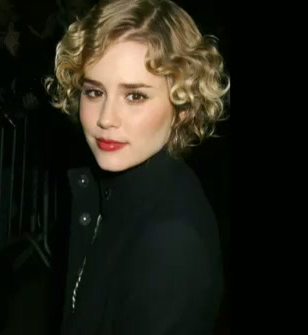

In [10]:
to_pil = torchvision.transforms.ToPILImage()
to_pil(dataset[0][0])

In [11]:
mtcnn = facenet_pytorch.MTCNN(image_size=224, margin=0)

In [12]:
dataset.resize(1000, 1000, 1000)
len(dataset)

10000000000

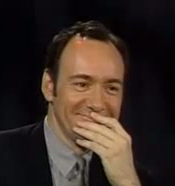

In [13]:
img = to_pil(dataset[1200000000][0])
img

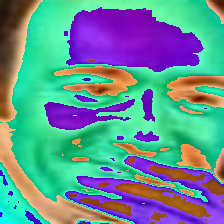

In [14]:
img_face = mtcnn(img)
to_pil(img_face)

In [15]:
facenet = facenet_pytorch.InceptionResnetV1(pretrained='vggface2').eval()

In [16]:
from torchinfo import summary
summary(facenet, (1, 3, 224, 224))

Layer (type:depth-idx)                        Output Shape              Param #
InceptionResnetV1                             [1, 512]                  4,427,703
├─BasicConv2d: 1-1                            [1, 32, 111, 111]         --
│    └─Conv2d: 2-1                            [1, 32, 111, 111]         864
│    └─BatchNorm2d: 2-2                       [1, 32, 111, 111]         64
│    └─ReLU: 2-3                              [1, 32, 111, 111]         --
├─BasicConv2d: 1-2                            [1, 32, 109, 109]         --
│    └─Conv2d: 2-4                            [1, 32, 109, 109]         9,216
│    └─BatchNorm2d: 2-5                       [1, 32, 109, 109]         64
│    └─ReLU: 2-6                              [1, 32, 109, 109]         --
├─BasicConv2d: 1-3                            [1, 64, 109, 109]         --
│    └─Conv2d: 2-7                            [1, 64, 109, 109]         18,432
│    └─BatchNorm2d: 2-8                       [1, 64, 109, 109]         128
│   

In [17]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1)
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 214.44it/s]


10

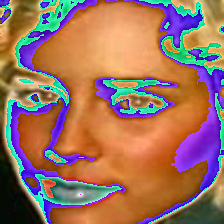

In [18]:
to_pil(dataset[0][0])

In [19]:
v = facenet(dataset[0][0].reshape(1, 3, 224, 224)).detach().numpy()
v.shape

(1, 512)

In [20]:
v

array([[-5.36144599e-02,  6.10724790e-03, -4.58128670e-06,
         1.70055870e-02,  1.05680129e-03,  2.23059803e-02,
         3.71379331e-02, -6.40316010e-02,  6.29142672e-02,
         5.31046093e-02, -4.30005789e-02,  2.20722184e-02,
        -1.85081735e-02, -2.84544770e-02, -2.58842506e-03,
        -2.12510768e-02,  9.15155932e-02,  8.86681080e-02,
        -2.53174407e-03, -1.94934960e-02, -7.91636407e-02,
        -9.46387183e-03,  2.72987653e-02,  3.79782962e-03,
        -5.63201346e-02,  4.47953008e-02, -6.31539673e-02,
        -7.33381091e-03, -4.83729579e-02,  2.16130074e-02,
        -1.04642473e-02,  2.55175252e-02, -2.81049274e-02,
        -6.68669343e-02, -4.92573753e-02, -1.33755347e-02,
        -1.17988810e-02, -5.21556549e-02, -1.94188245e-02,
        -1.28592504e-02, -2.91606765e-02, -5.99334873e-02,
        -3.84798609e-02, -8.70494824e-03,  1.35978544e-02,
        -1.98653229e-02,  4.14308012e-02, -7.26337265e-03,
         5.37705235e-02, -5.89153282e-02,  1.85409524e-0

In [21]:
def cos_similarity(v1, v2):
    val = np.inner(v1,v2)/(np.linalg.norm(v1)*np.linalg.norm(v2))
    return val.reshape(-1)[0]

def euc_similarity(v1, v2):
    return np.linalg.norm(v1-v2)

In [22]:
def validate(model, dataset, cnt = 20):
    _, axs = plt.subplots(nrows=cnt, ncols=3, figsize=(3*4, cnt*4))
    for i in range(cnt):
        idx = random.randint(0, len(dataset)-1)
        img1, img2, img3 = dataset[idx]
        v1 = model(img1.reshape(1, 3, 224, 224)).detach().numpy()
        v2 = model(img2.reshape(1, 3, 224, 224)).detach().numpy()
        v3 = model(img3.reshape(1, 3, 224, 224)).detach().numpy()
        title = '%d %f %f %f %f %f %f' % (idx,
            euc_similarity(v1, v2), euc_similarity(v1, v3),
            cos_similarity(v1, v2), cos_similarity(v1, v3),
            np.vstack((v1, v2, v3)).min(), np.vstack((v1, v2, v3)).max())
        plt.sca(axs[i, 0])
        plt.imshow(to_pil(img1))
        plt.axis('off')
        plt.sca(axs[i, 1])
        plt.imshow(to_pil(img2))
        plt.axis('off')
        plt.title(title)
        plt.sca(axs[i, 2])
        plt.imshow(to_pil(img3))
        plt.axis('off')
        print(title)

8 1.135674 1.473130 0.355122 -0.085056 -0.153493 0.122545
2 1.302623 1.408533 0.151587 0.008018 -0.156586 0.132879
0 0.374987 1.542371 0.929692 -0.189453 -0.155119 0.125561
5 0.637839 1.410643 0.796580 0.005042 -0.154275 0.116172
1 0.782701 1.061677 0.693690 0.436421 -0.131694 0.119463
6 0.549538 1.508868 0.849004 -0.138341 -0.131445 0.142015
4 1.175069 1.199938 0.309607 0.280075 -0.129503 0.149817
4 1.033646 1.222861 0.465788 0.252306 -0.151417 0.143576
9 0.367689 1.393500 0.932402 0.029079 -0.149567 0.125797
3 0.974123 1.329401 0.525542 0.116347 -0.151376 0.118989
4 1.028937 1.375626 0.470644 0.053827 -0.137799 0.133953
0 0.867031 1.493160 0.624129 -0.114763 -0.136890 0.125770
2 0.839082 1.160280 0.647971 0.326876 -0.151468 0.137508
3 0.841798 0.997381 0.645689 0.502616 -0.129662 0.183693
7 0.679348 1.358651 0.769243 0.077034 -0.155951 0.127891
1 0.638260 1.495313 0.796312 -0.117980 -0.132356 0.141076
7 0.825298 1.484776 0.659442 -0.102280 -0.147532 0.152838
8 1.129603 1.392216 0.361

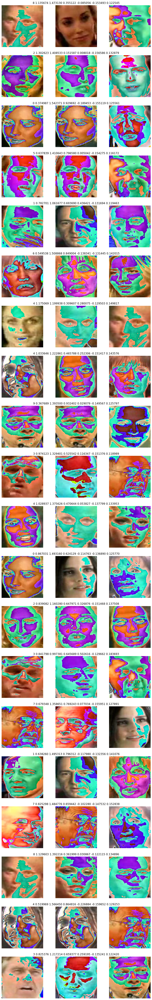

In [23]:
validate(facenet, dataset)

---

In [24]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=ResizeTransform())
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 269.63it/s]


10

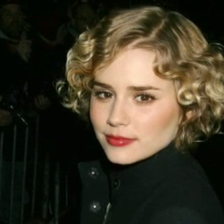

In [25]:
to_pil(dataset[0][0])

3 0.934708 1.092440 0.563160 0.403287 -0.144566 0.122118
2 1.279822 1.352981 0.181028 0.084722 -0.129504 0.122565
3 0.905885 1.307755 0.589686 0.144888 -0.150350 0.128946
4 1.033872 1.346465 0.465555 0.093516 -0.129661 0.145915
2 1.158911 1.311992 0.328463 0.139339 -0.128187 0.148432
9 0.528144 1.344115 0.860532 0.096678 -0.138927 0.133059
6 0.488042 1.435662 0.880908 -0.030562 -0.157620 0.139089
5 0.470765 1.041322 0.889190 0.457824 -0.129700 0.142801
6 0.468593 1.480630 0.890210 -0.096134 -0.133073 0.138562
4 0.982422 1.184366 0.517423 0.298639 -0.136799 0.128946
8 0.787089 1.344341 0.690246 0.096373 -0.150128 0.136516
2 1.002888 1.449804 0.497108 -0.050967 -0.113211 0.129613
3 0.874021 0.929047 0.618044 0.568436 -0.127254 0.127680
1 0.629550 1.210444 0.801833 0.267413 -0.149289 0.129830
6 0.631342 1.515069 0.800704 -0.147717 -0.140409 0.143808
6 0.529052 1.398653 0.860052 0.021885 -0.128134 0.147610
6 0.722046 1.367957 0.739324 0.064346 -0.136626 0.144125
0 0.939560 1.304503 0.55861

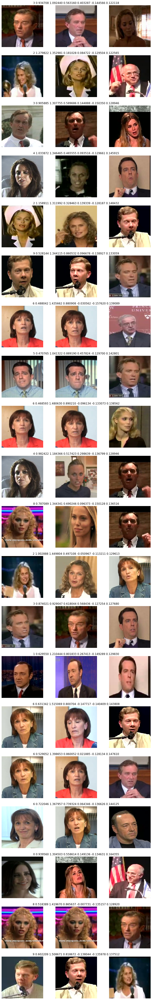

In [26]:
validate(facenet, dataset)

---

In [31]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=NormalizeTransform())
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 202.62it/s]


10

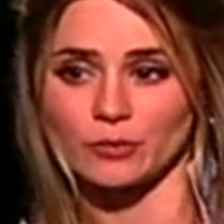

In [40]:
to_pil(dataset[0][0])

3 0.919254 1.181836 0.577486 0.301632 -0.138099 0.148755
6 0.442657 1.397690 0.902027 0.023232 -0.161889 0.138314
3 0.876528 1.061214 0.615849 0.436913 -0.135429 0.132614
8 0.252083 1.290666 0.968227 0.167091 -0.137317 0.125180
2 1.042098 1.405176 0.457016 0.012740 -0.138034 0.146485
2 1.014300 1.585134 0.485598 -0.256325 -0.151014 0.164167
1 0.582277 1.095106 0.830477 0.400371 -0.137295 0.123437
1 0.655650 1.507029 0.785061 -0.135569 -0.124849 0.120065
4 1.203350 1.563296 0.275974 -0.221947 -0.138150 0.119731
7 0.775908 1.129487 0.698984 0.362129 -0.145984 0.125952
2 1.126940 1.094458 0.365003 0.401081 -0.135203 0.140538
5 0.495653 1.188748 0.877164 0.293439 -0.146166 0.141700
7 0.860613 1.220941 0.629673 0.254652 -0.155945 0.146704
0 0.412040 1.419896 0.915112 -0.008052 -0.138376 0.153828
8 0.304087 1.317168 0.953765 0.132535 -0.140082 0.144669
5 0.726224 1.432850 0.736300 -0.026529 -0.134758 0.136634
4 0.849237 1.267606 0.639398 0.196588 -0.139695 0.153889
7 0.396908 1.485295 0.9212

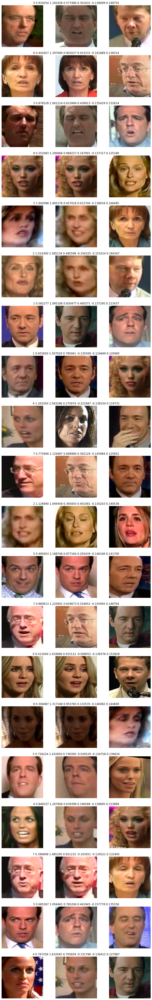

In [33]:
validate(facenet, dataset)

---

In [41]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=NormalizeTransform(color_jitter=0.99))
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 173.32it/s]


10

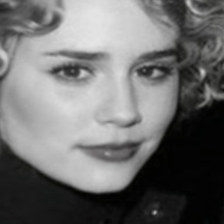

In [54]:
to_pil(dataset[0][0])

7 0.820405 1.471290 0.663468 -0.082347 -0.145056 0.147206
2 0.939498 1.258871 0.558672 0.207622 -0.155960 0.130391
5 0.799809 1.451593 0.680153 -0.053560 -0.143598 0.138957
7 0.696725 1.066484 0.757287 0.431306 -0.139786 0.118214
2 0.771749 1.433727 0.702201 -0.027786 -0.138572 0.168883
7 0.645301 1.358205 0.791793 0.077640 -0.142236 0.132912
9 0.605526 1.462844 0.816669 -0.069957 -0.162525 0.154461
2 1.283034 1.136549 0.176911 0.354128 -0.134301 0.128795
6 0.712971 1.419925 0.745836 -0.008094 -0.132940 0.121990
9 0.679158 1.319042 0.769372 0.130064 -0.135154 0.146592
1 0.713691 1.546408 0.745323 -0.195688 -0.128381 0.147519
0 0.648025 1.171907 0.790032 0.313317 -0.176082 0.154867
0 0.918010 1.418413 0.578629 -0.005948 -0.148089 0.127140
6 0.556904 1.326703 0.844929 0.119930 -0.140015 0.142627
0 0.400849 1.103425 0.919660 0.391227 -0.149139 0.130911
0 0.526690 1.532832 0.861299 -0.174786 -0.171699 0.137496
6 0.661169 1.308637 0.781428 0.143734 -0.133854 0.131843
9 0.342843 1.217081 0.9

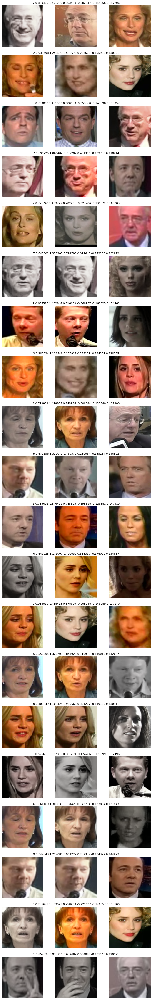

In [55]:
validate(facenet, dataset)

1 0.725166 0.970742 0.737067 0.528830 -0.146835 0.128893
1 0.584242 1.420632 0.829331 -0.009098 -0.148304 0.132688
8 0.956658 1.591690 0.542402 -0.266739 -0.134799 0.139764
7 0.319084 1.492756 0.949093 -0.114160 -0.168165 0.131943
8 0.551451 1.270434 0.847951 0.192999 -0.154829 0.132144
1 0.689800 1.172783 0.762088 0.312290 -0.127652 0.149139
6 0.648373 1.444854 0.789806 -0.043801 -0.144188 0.136621
3 0.840592 1.476061 0.646702 -0.089378 -0.144793 0.120749
5 0.755947 1.365927 0.714272 0.067122 -0.144945 0.148204
9 0.641140 1.463105 0.794470 -0.070338 -0.143513 0.146521
2 1.262397 1.500587 0.203177 -0.125881 -0.151990 0.168503
1 0.241801 1.139703 0.970766 0.350538 -0.129093 0.138779
6 0.719808 1.323675 0.740938 0.123942 -0.139007 0.133136
9 0.658306 1.360819 0.783316 0.074085 -0.141203 0.148772
2 1.164722 1.507921 0.321712 -0.136913 -0.122419 0.131618
3 0.438234 1.474607 0.903976 -0.087232 -0.137525 0.144742
2 1.183705 1.413520 0.299422 0.000981 -0.148390 0.140258
7 0.935455 1.328176 0.

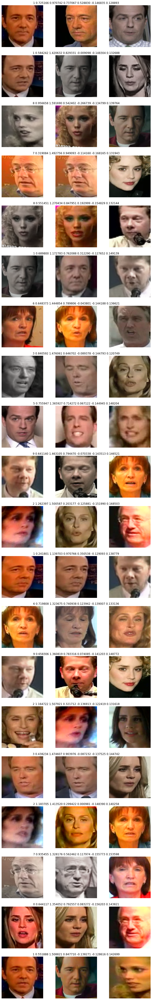

In [56]:
validate(facenet, dataset)